In [1]:
import torch
import math
import pandas as pd
import numpy as np
from torch_geometric.nn import MessagePassing
from torch_geometric.nn import GATConv
from torch_geometric.data import InMemoryDataset
#from torch_geometric.data import Data
from torch_geometric.utils import add_self_loops,degree
from torch_geometric.datasets import Planetoid
import ssl
import torch.nn.functional as F
from torch import nn
from sklearn.preprocessing import scale
from sklearn.metrics.pairwise import cosine_similarity
from torch_geometric.data import Data

/home/jjy/.conda/envs/jjyconda3/lib/python3.6/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
#print(torch.__version__)

1.10.2+cu113


# x

In [4]:
data1=pd.read_csv("r1_onehot.csv",index_col=0)
data2=pd.read_csv("d1_onehot.csv",index_col=0)
data3=pd.read_csv("l1_onehot.csv",index_col=0)
data1=data1.iloc[:,1:]
data2=data2.iloc[:,1:]
data3=data3.iloc[:,1:]
my_array1 = np.array(data1)
my_array1=scale(X=my_array1,axis=0,with_mean=True,with_std=True,copy=True)
x1 = torch.tensor(my_array1, dtype=torch.float)
my_array2 = np.array(data2)
my_array2=scale(X=my_array2,axis=0,with_mean=True,with_std=True,copy=True)
x2 = torch.tensor(my_array2, dtype=torch.float)
my_array3 = np.array(data3)
my_array3=scale(X=my_array3,axis=0,with_mean=True,with_std=True,copy=True)
x3 = torch.tensor(my_array3, dtype=torch.float)

In [5]:
x3

tensor([[-0.0158, -1.8222, -0.1209,  ...,  0.5309, -0.4966, -0.0888],
        [-0.0158,  0.3265, -0.1209,  ..., -1.8835,  2.0136, -0.0888],
        [-0.0158,  1.1305, -0.1209,  ...,  0.5309, -0.4966, -0.0888],
        ...,
        [-0.0158,  1.1451, -0.1209,  ...,  0.5309, -0.4966, -0.0888],
        [-0.0158, -2.1474,  0.3044,  ...,  0.5309, -0.4966, -0.0888],
        [-0.0158,  0.4471,  0.6573,  ...,  0.5309, -0.4966, -0.0888]])

# edge

In [6]:
datar1=pd.read_csv("ahmadr1.csv")
datad1=pd.read_csv("d1_onehot.csv",index_col=0)
datal1=pd.read_csv("ahmadl1.csv")

In [7]:
datad1=pd.DataFrame(cosine_similarity(datad1.iloc[:,1:]))

In [8]:
datar1[datar1<15000000000]=1
datad1[datad1>0.996974]=1
datal1[datal1<2188000000]=1
datar1[datar1!=1]=0
datad1[datad1!=1]=0
datal1[datal1!=1]=0

In [9]:
dr1=datar1
dr2=datad1
dr3=datal1

In [10]:
dr3

Unnamed: 0  \
572  3.814471e+10 8.069534e+10 3.280930e+10 3.815797e+10 2.570615e+10 1.842738e+10 2.505820e+11 1.313001e+10 3.203083e+10 4.105076e+10 2.251509e+10 3.237387e+10 2.864277e+10 2.282999e+10 1.507082e+10 2.457957e+10 6.210636e+09 3.475211e+10 1.305877e+10 2.447395e+10 2.986936e+10 3.257776e+08 1.297234e+11 2.681181e+10 2.155078e+10 2.275065e+09 2.553808e+11 3.028102e+10 1.122655e+10 6.323310e+09 3.762698e+09 5.277983e+11 1.625319e+10 2.134969e+11 2.879340e+10 1.928456e+10 5.276668e+10 2.071124e+10 3.350824e+10 2.293880e+10 1.008038e+10 1.295053e+10 1.298100e+10 2.576172e+09 3.787001e+09 4.068859e+09 5.257914e+09 3.877934e+10 1.003349e+12 3.691518e+10 2.132905e+10 2.951350e+10 1.151401e+10 1.022243e+10 2.101113e+11 8.066334e+12 5.819703e+09 8.326055e+09 1.608967e+10 4.546683e+10 6.956769e+08 3.534720e+10 2.543016e+10 1.406623e+10 6.109138e+09 1.399941e+10 1.496158e+10 2.434074e+10 1.025395e+11 6.044902e+11 1.405997e+10 2.301400e+07 4.010326e+13 2.619750e+10 2.254555e+10 2.154031e+10 6.958539e+09 3.962040e+09 1.690791e+11 3.113473e+10 2.441235e+10 8.917497e+09 4.952799e+10 3.619586e+10 2.434307e+10 2.844177e+10 2.494894e+11 5.615514e+11 6.155293e+10 1.061273e+10 1.342294e+08 2.971327e+11 1.751625e+10 1.828016e+10 3.457824e+10 2.472040e+11 7.627589e+09 3.325191e+10 1.111419e+10 7.013205e+10 6.992819e+11 2.214465e+10 2.343572e+10 8.148023e+11 1.761410e+10 3.180406e+10 2.697519e+10 7.631947e+09 2.586512e+10 1.016098e+10 7.605459e+08 9.363216e+09 9.423245e+07 2.499545e+11 3.344956e+10 4.163906e+11 1.268123e+10 2.788441e+10 2.421601e+10 2.188730e+09 2.280345e+10 3.512690e+11 7.184195e+06 2.652200e+10 7.847156e+10 2.312410e+10 2.816069e+10 4.221682e+10 1.462243e+10 5.833994e+10 6.353698e+09 2.079658e+10 2.644656e+10 1.971357e+10 1.629897e+11 7.341250e+12 3.530328e+10 1.742440e+10 9.887248e+09 1.394937e+09 1.017587e+09 6.138820e+12 2.307962e+10 2.078798e+10 4.112848e+10 3.791872e+10 7.627707e+09 2.859976e+09 3.353244e+10 4.306007e+10 2.179906e+10 4.361262e+10 4.072683e+10 4.709301e+10 6.128135e+11 2.198619e+11 3.497918e+10 6.526584e+11 3.156727e+10 2.212691e+10 5.101119e+13 7.820278e+11 2.179937e+10 2.041531e+10 7.442989e+09 3.396935e+10 7.855814e+12 4.752131e+10 2.368368e+10 1.861849e+11 2.771409e+10 1.037347e+12 3.872163e+10 1.959113e+10 1.680944e+10 3.951174e+10 3.668529e+10 2.429253e+10 3.885134e+10 3.225427e+10 4.206632e+10 9.673104e+10 1.544578e+10 1.090750e+10 2.621638e+10 2.251145e+10 6.262215e+09 1.927568e+10 2.276819e+10 1.985744e+10 3.237884e+10 3.465588e+10 5.953958e+10 2.382614e+10 9.519472e+08 3.306996e+10 3.924705e+10 1.409171e+10 4.943331e+10 1.701026e+10 2.258613e+10 8.390345e+09 3.146831e+10 3.035986e+10 1.987715e+10 3.113542e+08 1.352935e+10 1.998249e+11 2.849504e+10 1.392830e+12 4.203710e+09 1.452352e+13 1.608621e+10 5.952768e+10 6.218088e+11 6.033159e+10 3.204715e+10 3.367607e+10 8.111200e+11 1.561372e+12 7.753093e+10 1.493394e+08 9.270773e+09 2.233143e+10 1.194368e+10 1.634529e+11 2.092277e+10 2.080974e+10 2.397477e+10 1.980878e+09 4.477672e+09 1.519680e+10 1.280146e+10 3.752498e+10 2.767588e+10 3.081292e+10 3.593047e+10 4.943337e+10 2.116379e+09 4.943330e+10 1.482810e+14 1.757941e+10 2.349253e+11 8.243537e+09 2.393213e+10 4.123043e+10 4.699275e+11 3.026506e+09 2.955069e+10 4.105734e+10 2.572436e+11 5.472120e+10 2.397422e+10 5.764712e+09 8.240305e+11 1.952173e+10 3.144414e+10 4.047350e+10 6.387635e+09 1.404546e+10 8.952526e+09 9.582307e+09 5.183090e+10 2.885839e+12 7.810222e+09 5.235335e+11 4.234399e+10 1.269649e+11 1.263079e+10 9.264682e+10 3.388010e+10 2.337417e+10 3.336328e+10 3.385452e+10 8.960321e+09 3.676216e+10 3.370722e+10 3.349351e+10 1.372791e+11 3.003433e+10 1.626157e+10 1.271715e+10 5.183118e+10 2.296165e+10 1.743933e+10 1.050600e+10 3.021838e+10 5.273690e+10 1.704813e+10 3.183324e+10 1.282382e+11 4.810017e+09 2.410411e+09 2.426384e+10 1.187742e+10 7.921732e+11 3.090620e+10 3.146696e+10 2.415972e+10 6.006995e+10 1.281491e+10 3.512827e+09 4.602880e+10 3.264809e+10 8.259627e+09 4.193815e+11 3.3

In [11]:
dr1=np.array(dr1)
edge_index1=np.array(np.where(dr1 == 1))
dr2=np.array(dr2)
edge_index2=np.array(np.where(dr2 == 1))
dr3=np.array(dr3)
edge_index3=np.array(np.where(dr3 == 1))

In [12]:
edge_index1=torch.tensor(edge_index1, dtype=torch.long)
edge_index2=torch.tensor(edge_index2, dtype=torch.long)
edge_index3=torch.tensor(edge_index3, dtype=torch.long)

# y

In [13]:
m=pd.read_csv("binary.csv",index_col=0)
y=np.array(m['y_or_n'])
y = torch.tensor(y,dtype=torch.float)
y

tensor([0., 0., 1.,  ..., 0., 0., 1.])

# train_mask & test_mask

In [14]:
train_mask = torch.zeros(y.size(0), dtype=torch.bool)
for i in range(int(y.max()) + 1):
    p=int(((y == i).nonzero(as_tuple=False).shape[0])*0.7)
    train_mask[(y == i).nonzero(as_tuple=False)[0:p]] = True

In [15]:
remaining=(~train_mask).nonzero(as_tuple=False).view(-1)
remaining=remaining[torch.randperm(remaining.size(0))]

In [16]:
test_mask = torch.zeros(y.size(0), dtype=torch.bool)
test_mask.fill_(False)
test_mask[remaining[:]]=True
test_mask

tensor([False, False, False,  ...,  True,  True,  True])

In [17]:
dataset1 = Data(x=x1, edge_index=edge_index1, y=y, train_mask=train_mask, test_mask=test_mask)
dataset2 = Data(x=x2, edge_index=edge_index2, y=y, train_mask=train_mask, test_mask=test_mask)
dataset3 = Data(x=x3, edge_index=edge_index3, y=y, train_mask=train_mask, test_mask=test_mask)

In [18]:
#print(dataset1)
#print(dataset2)
#print(dataset3)

In [19]:
data_all = {'data1': dataset1, 'data2':dataset2, 'data3':dataset3}

data_all={key:data_all[key].cuda() for key in data_all}

data_all


{'data1': Data(x=[9841, 39], edge_index=[2, 601790], y=[9841], train_mask=[9841], test_mask=[9841]),
 'data2': Data(x=[9841, 19], edge_index=[2, 9685431], y=[9841], train_mask=[9841], test_mask=[9841]),
 'data3': Data(x=[9841, 14], edge_index=[2, 3583232], y=[9841], train_mask=[9841], test_mask=[9841])}

In [21]:
class Net_all(torch.nn.Module):
    def __init__(self):
        super(Net_all, self).__init__()
        self.gat1_1 = GATConv(dataset1.num_node_features, 8, 9, dropout=0.8)
        #self.gat1_2 = GATConv(64, 8, 8, dropout=0.8)
        
        self.gat2_1 = GATConv(dataset2.num_node_features, 8, 9, dropout=0.8)
        #self.gat2_2 = GATConv(64, 8, 8, dropout=0.8)

        self.gat3_1 = GATConv(dataset3.num_node_features, 8, 9, dropout=0.8)
        #self.gat3_2 = GATConv(64, 8, 8, dropout=0.8)
        self.re = nn.ReLU()
        self.fnn = nn.Linear(216, 2)


    def forward(self, data):
        data1 = data['data1']
        data2 = data['data2']
        data3 = data['data3']

        x1 = self.gat1_1(data1.x, data1.edge_index)
        #x1 = self.gat1_2(x1, data1.edge_index)
        
        x2 = self.gat2_1(data2.x, data2.edge_index)
        #x2 = self.gat2_2(x2, data2.edge_index)

        x3 = self.gat3_1(data3.x, data3.edge_index)
        #x3 = self.gat3_2(x3, data3.edge_index)
        # print(x1.shape)
        # print(x2.shape)
        # print(x3.shape)
        x = torch.cat((x1,x2, x3), 1)
        
        # print(x.shape)
        x = self.re(x)
        x = self.fnn(x)
        
        # x = x.view(data1.x.shape[0])
        return F.softmax(x, dim=1)


# torch.cuda.empty_cache()
data = data_all
model = Net_all().to('cuda')
# data = dataset.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)

model.train()
loss_fn = torch.nn.MSELoss()

train_iterations = []
train_loss = []
for epoch in range(2000):
    optimizer.zero_grad()
    out = model(data)
    loss = F.nll_loss(out[data['data1'].train_mask], data['data1'].y[data['data1'].train_mask].long())
    loss.backward()
    #print(loss)
    optimizer.step()
    train_loss.append(loss.item())
    train_iterations.append(epoch+1)
    print(f"epoch:{epoch+1}, loss:{loss.item()}")
model.eval()
#pred = model(data).max(dim=1).indices
#correct = int(pred[data['data1'].test_mask].eq(data['data1'].y[data['data1'].test_mask]).sum().item())
#acc = correct / int(data['data1'].test_mask.sum())
#print('Accuracy:{:.4f}'.format(acc))

epoch:1, loss:-0.5145969986915588
epoch:2, loss:-0.6322354078292847
epoch:3, loss:-0.6809877157211304
epoch:4, loss:-0.7022862434387207
epoch:5, loss:-0.7095704078674316
epoch:6, loss:-0.7123196125030518
epoch:7, loss:-0.7133409380912781
epoch:8, loss:-0.713717520236969
epoch:9, loss:-0.7138806581497192
epoch:10, loss:-0.7140313386917114
epoch:11, loss:-0.7140809297561646
epoch:12, loss:-0.7140803933143616
epoch:13, loss:-0.7140803337097168
epoch:14, loss:-0.7140939831733704
epoch:15, loss:-0.7140923738479614
epoch:16, loss:-0.7141138315200806
epoch:17, loss:-0.7141236066818237
epoch:18, loss:-0.7141203880310059
epoch:19, loss:-0.7141256928443909
epoch:20, loss:-0.714118480682373
epoch:21, loss:-0.7141241431236267
epoch:22, loss:-0.71412193775177
epoch:23, loss:-0.7141250967979431
epoch:24, loss:-0.7141240239143372
epoch:25, loss:-0.7141190767288208
epoch:26, loss:-0.7141164541244507
epoch:27, loss:-0.714116096496582
epoch:28, loss:-0.7141129374504089
epoch:29, loss:-0.714114248752594


epoch:233, loss:-0.8114405274391174
epoch:234, loss:-0.8116040229797363
epoch:235, loss:-0.8128890991210938
epoch:236, loss:-0.8129339218139648
epoch:237, loss:-0.8145419955253601
epoch:238, loss:-0.8125224113464355
epoch:239, loss:-0.8135346174240112
epoch:240, loss:-0.8149287700653076
epoch:241, loss:-0.8117426037788391
epoch:242, loss:-0.8117476105690002
epoch:243, loss:-0.811166524887085
epoch:244, loss:-0.8133293986320496
epoch:245, loss:-0.8135555386543274
epoch:246, loss:-0.8139820694923401
epoch:247, loss:-0.8105801939964294
epoch:248, loss:-0.8126168251037598
epoch:249, loss:-0.8120824098587036
epoch:250, loss:-0.8126662373542786
epoch:251, loss:-0.8106692433357239
epoch:252, loss:-0.8138871788978577
epoch:253, loss:-0.8130683302879333
epoch:254, loss:-0.8129500150680542
epoch:255, loss:-0.8165122270584106
epoch:256, loss:-0.8134328722953796
epoch:257, loss:-0.8135214447975159
epoch:258, loss:-0.8135235905647278
epoch:259, loss:-0.8133653998374939
epoch:260, loss:-0.8149865865

epoch:463, loss:-0.8171258568763733
epoch:464, loss:-0.8158092498779297
epoch:465, loss:-0.8167952299118042
epoch:466, loss:-0.8154608607292175
epoch:467, loss:-0.8160502314567566
epoch:468, loss:-0.8167434930801392
epoch:469, loss:-0.8179504871368408
epoch:470, loss:-0.8189828395843506
epoch:471, loss:-0.816720187664032
epoch:472, loss:-0.8165227174758911
epoch:473, loss:-0.8168420195579529
epoch:474, loss:-0.8149798512458801
epoch:475, loss:-0.8168527483940125
epoch:476, loss:-0.8183068037033081
epoch:477, loss:-0.817955732345581
epoch:478, loss:-0.8186197280883789
epoch:479, loss:-0.8156336545944214
epoch:480, loss:-0.8168540000915527
epoch:481, loss:-0.81890869140625
epoch:482, loss:-0.8176208734512329
epoch:483, loss:-0.819098949432373
epoch:484, loss:-0.8170887231826782
epoch:485, loss:-0.8192191123962402
epoch:486, loss:-0.8182593584060669
epoch:487, loss:-0.8155944347381592
epoch:488, loss:-0.819169282913208
epoch:489, loss:-0.8167970180511475
epoch:490, loss:-0.815609037876129

epoch:693, loss:-0.8174527883529663
epoch:694, loss:-0.8174962997436523
epoch:695, loss:-0.8171990513801575
epoch:696, loss:-0.8199135661125183
epoch:697, loss:-0.8183019757270813
epoch:698, loss:-0.8182680606842041
epoch:699, loss:-0.8184716105461121
epoch:700, loss:-0.8187397718429565
epoch:701, loss:-0.8176528811454773
epoch:702, loss:-0.817961573600769
epoch:703, loss:-0.8183650970458984
epoch:704, loss:-0.8184304237365723
epoch:705, loss:-0.8189711570739746
epoch:706, loss:-0.8161941766738892
epoch:707, loss:-0.8178015947341919
epoch:708, loss:-0.8176663517951965
epoch:709, loss:-0.8188955187797546
epoch:710, loss:-0.8204664587974548
epoch:711, loss:-0.8186960816383362
epoch:712, loss:-0.8175292015075684
epoch:713, loss:-0.8188600540161133
epoch:714, loss:-0.8185663819313049
epoch:715, loss:-0.8175986409187317
epoch:716, loss:-0.8176074028015137
epoch:717, loss:-0.817331850528717
epoch:718, loss:-0.8185676336288452
epoch:719, loss:-0.8194573521614075
epoch:720, loss:-0.81589466333

epoch:923, loss:-0.8180230855941772
epoch:924, loss:-0.8187333345413208
epoch:925, loss:-0.8190574049949646
epoch:926, loss:-0.8166801929473877
epoch:927, loss:-0.8189045786857605
epoch:928, loss:-0.8182764649391174
epoch:929, loss:-0.8173002004623413
epoch:930, loss:-0.8194932341575623
epoch:931, loss:-0.8188090920448303
epoch:932, loss:-0.817615270614624
epoch:933, loss:-0.8191401362419128
epoch:934, loss:-0.8181849122047424
epoch:935, loss:-0.8195639848709106
epoch:936, loss:-0.8181378245353699
epoch:937, loss:-0.8157402276992798
epoch:938, loss:-0.8188291788101196
epoch:939, loss:-0.8184489011764526
epoch:940, loss:-0.8186963796615601
epoch:941, loss:-0.8185465931892395
epoch:942, loss:-0.8199924230575562
epoch:943, loss:-0.8205096125602722
epoch:944, loss:-0.8200995922088623
epoch:945, loss:-0.8172575235366821
epoch:946, loss:-0.8172782063484192
epoch:947, loss:-0.8195929527282715
epoch:948, loss:-0.8193272948265076
epoch:949, loss:-0.8197231292724609
epoch:950, loss:-0.8207608461

epoch:1149, loss:-0.8184450268745422
epoch:1150, loss:-0.8184090256690979
epoch:1151, loss:-0.8194500803947449
epoch:1152, loss:-0.8184113502502441
epoch:1153, loss:-0.8187279105186462
epoch:1154, loss:-0.8177161812782288
epoch:1155, loss:-0.8180758953094482
epoch:1156, loss:-0.8171265721321106
epoch:1157, loss:-0.8186967968940735
epoch:1158, loss:-0.818621814250946
epoch:1159, loss:-0.8169229030609131
epoch:1160, loss:-0.8190750479698181
epoch:1161, loss:-0.8186636567115784
epoch:1162, loss:-0.8167053461074829
epoch:1163, loss:-0.8191168904304504
epoch:1164, loss:-0.8163332343101501
epoch:1165, loss:-0.8184703588485718
epoch:1166, loss:-0.8196735978126526
epoch:1167, loss:-0.8204154372215271
epoch:1168, loss:-0.8178189396858215
epoch:1169, loss:-0.8176981806755066
epoch:1170, loss:-0.8189009428024292
epoch:1171, loss:-0.8190453052520752
epoch:1172, loss:-0.8186429738998413
epoch:1173, loss:-0.816205620765686
epoch:1174, loss:-0.8186966776847839
epoch:1175, loss:-0.8179970383644104
epo

epoch:1373, loss:-0.8212200403213501
epoch:1374, loss:-0.8173278570175171
epoch:1375, loss:-0.8186755180358887
epoch:1376, loss:-0.8199021220207214
epoch:1377, loss:-0.8173269033432007
epoch:1378, loss:-0.8190677165985107
epoch:1379, loss:-0.8186063766479492
epoch:1380, loss:-0.8174768090248108
epoch:1381, loss:-0.81765216588974
epoch:1382, loss:-0.8193721771240234
epoch:1383, loss:-0.818615198135376
epoch:1384, loss:-0.8196582794189453
epoch:1385, loss:-0.8175292015075684
epoch:1386, loss:-0.8203299641609192
epoch:1387, loss:-0.8163658976554871
epoch:1388, loss:-0.8184230327606201
epoch:1389, loss:-0.8173285126686096
epoch:1390, loss:-0.8184851408004761
epoch:1391, loss:-0.8191311955451965
epoch:1392, loss:-0.8200268149375916
epoch:1393, loss:-0.816426157951355
epoch:1394, loss:-0.8200154304504395
epoch:1395, loss:-0.8193955421447754
epoch:1396, loss:-0.8185304403305054
epoch:1397, loss:-0.8197400569915771
epoch:1398, loss:-0.8192033767700195
epoch:1399, loss:-0.8199360370635986
epoch

epoch:1597, loss:-0.817560076713562
epoch:1598, loss:-0.8195885419845581
epoch:1599, loss:-0.818241536617279
epoch:1600, loss:-0.818676233291626
epoch:1601, loss:-0.8193150758743286
epoch:1602, loss:-0.8183405995368958
epoch:1603, loss:-0.8208175897598267
epoch:1604, loss:-0.8178211450576782
epoch:1605, loss:-0.8182604908943176
epoch:1606, loss:-0.8188149929046631
epoch:1607, loss:-0.8186465501785278
epoch:1608, loss:-0.8170368671417236
epoch:1609, loss:-0.8193952441215515
epoch:1610, loss:-0.8198382258415222
epoch:1611, loss:-0.818110466003418
epoch:1612, loss:-0.8187599778175354
epoch:1613, loss:-0.8197234272956848
epoch:1614, loss:-0.8205130696296692
epoch:1615, loss:-0.8191927671432495
epoch:1616, loss:-0.8173112869262695
epoch:1617, loss:-0.8208315372467041
epoch:1618, loss:-0.8196802735328674
epoch:1619, loss:-0.8174498677253723
epoch:1620, loss:-0.8199017643928528
epoch:1621, loss:-0.818296492099762
epoch:1622, loss:-0.8203836679458618
epoch:1623, loss:-0.8197497129440308
epoch:

epoch:1821, loss:-0.8191916942596436
epoch:1822, loss:-0.8198081851005554
epoch:1823, loss:-0.8205880522727966
epoch:1824, loss:-0.8199481964111328
epoch:1825, loss:-0.8197721838951111
epoch:1826, loss:-0.8194665908813477
epoch:1827, loss:-0.8190323710441589
epoch:1828, loss:-0.8174545764923096
epoch:1829, loss:-0.8181203603744507
epoch:1830, loss:-0.8209990859031677
epoch:1831, loss:-0.8188104629516602
epoch:1832, loss:-0.8169564008712769
epoch:1833, loss:-0.8187799453735352
epoch:1834, loss:-0.8183658719062805
epoch:1835, loss:-0.818446159362793
epoch:1836, loss:-0.8199294209480286
epoch:1837, loss:-0.8191946744918823
epoch:1838, loss:-0.8173508644104004
epoch:1839, loss:-0.8172675967216492
epoch:1840, loss:-0.8203087449073792
epoch:1841, loss:-0.8176910877227783
epoch:1842, loss:-0.8191606402397156
epoch:1843, loss:-0.8193917274475098
epoch:1844, loss:-0.8200815320014954
epoch:1845, loss:-0.8180939555168152
epoch:1846, loss:-0.8197628855705261
epoch:1847, loss:-0.8202899098396301
ep

Net_all(
  (gat1_1): GATConv(39, 8, heads=9)
  (gat2_1): GATConv(19, 8, heads=9)
  (gat3_1): GATConv(14, 8, heads=9)
  (re): ReLU()
  (fnn): Linear(in_features=216, out_features=2, bias=True)
)

In [26]:
pred = model(data).max(dim=1).indices
correct = int(pred[data['data1'].test_mask].eq(data['data1'].y[data['data1'].test_mask]).sum().item())
acc = correct / int(data['data1'].test_mask.sum())
print('Accuracy:{:.4f}'.format(acc))

Accuracy:0.8293


In [22]:
from sklearn.metrics import classification_report, roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix, accuracy_score

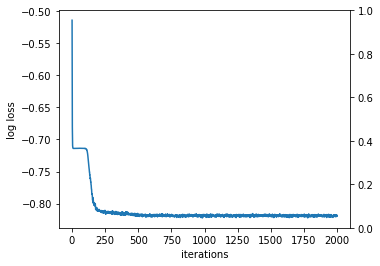

In [24]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import host_subplot
host = host_subplot(111)

plt.subplots_adjust(right=0.8) # ajust the right boundary of the plot window
par1 = host.twinx()
# set labels
host.set_xlabel("iterations")
host.set_ylabel("log loss")
p1, = host.plot(train_iterations, train_loss, label="training log loss")

In [35]:
y_t = data['data1'].y[data['data1'].train_mask].cpu().numpy()
predr = pred[data['data1'].train_mask].cpu().numpy()

In [36]:
predr

array([0, 0, 1, ..., 0, 0, 0])

In [29]:
print("accuracy_score:", accuracy_score(y_t, predr))
print("ROC AUC score:", roc_auc_score(y_t, predr))

p = precision_score(y_t, predr, average='binary')

#p4 = precision_score(actual, predicted, average='samples')
 
r = recall_score(y_t, predr, average='binary')


f1score = f1_score(y_t, predr, average='binary')



print("precision_score:",p)
print("recall_score:",r)
print("f1_score:",f1score)
print("混淆矩阵：",confusion_matrix(y_t, predr))

accuracy_score: 0.8293261090416526
ROC AUC score: 0.7660932945916733
precision_score: 0.7414772727272727
recall_score: 0.6184834123222749
f1_score: 0.6744186046511628
混淆矩阵： [[1927  182]
 [ 322  522]]


In [30]:
pred[data['data1'].test_mask].sum()

tensor(704, device='cuda:0')

In [31]:
data['data1'].y[data['data1'].test_mask].sum()

tensor(844., device='cuda:0')

In [39]:
m

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY_x,AMT_GOODS_PRICE,CNT_FAM_MEMBERS,...,AMT_CREDIT_MAX_OVERDUE,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,AMT_ANNUITY_y,Active_count_y,Closed_count,CREDIT_TYPE_MAX,y_or_n
0,100043,Cash loans,0,1,2,198000.0,641173.5,23157.0,553500.0,4.0,...,0.00,27720.00000,0.00000,0.00000,0.0,16290.00,0.0,31.0,Consumer credit,0
1,100131,Cash loans,0,1,0,270000.0,891072.0,45625.5,720000.0,1.0,...,0.00,274500.00000,267232.50000,0.00000,0.0,81000.00,23.0,0.0,Credit card,0
2,100139,Cash loans,0,0,1,157500.0,302341.5,24016.5,261000.0,3.0,...,0.00,41755.50000,0.00000,0.00000,0.0,14134.50,0.0,74.0,Consumer credit,1
3,100145,Cash loans,1,1,1,202500.0,260725.5,16789.5,198000.0,2.0,...,0.00,26995.50000,0.00000,0.00000,0.0,0.00,0.0,96.0,Consumer credit,0
4,100148,Cash loans,0,1,0,247500.0,755190.0,36459.0,675000.0,2.0,...,0.00,135000.00000,133771.50000,1226.88000,0.0,13500.00,66.0,0.0,Credit card,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9836,456215,Cash loans,0,0,1,144000.0,1303200.0,46809.0,1125000.0,3.0,...,0.00,19497.15000,0.00000,0.00000,0.0,6484.50,0.0,94.0,Consumer credit,0
9837,456219,Cash loans,0,1,1,112500.0,521280.0,31630.5,450000.0,3.0,...,175.50,112500.00000,0.00000,0.00000,0.0,13387.50,9.0,9.0,Consumer credit,0
9838,456233,Cash loans,0,1,0,225000.0,521280.0,23089.5,450000.0,2.0,...,0.00,282663.31500,223943.89500,0.00000,0.0,7537.50,7.0,0.0,Consumer credit,0
9839,456244,Cash loans,0,1,0,261000.0,1303812.0,35982.0,1138500.0,2.0,...,12038.67,165273.87375,-133.66125,133.66125,0.0,11864.25,40.0,120.0,Consumer credit,0


In [47]:
pred.cpu().numpy()
m['pred']=pred.cpu().numpy()

array([0, 0, 1, ..., 0, 0, 1])

In [50]:
m['y_or_n']

In [51]:
m[['y_or_n','pred']]

,y_or_n,pred
0,0,0
1,0,0
2,1,1
3,0,1
4,1,1
...,...,...
9836,0,0
9837,0,0
9838,0,0
9839,0,0


In [52]:
#m.to_csv("pre0322.csv")